This contains experiments to see how to access and map the City of Chicago's databases

In [236]:
import pandas as pd
import numpy as np
import matplotlib
from sodapy import Socrata
import folium
import matplotlib.pyplot as plt
%matplotlib inline 

In [237]:
url = 'https://data.cityofchicago.org/resource/85ca-t3if.json?$$app_token=<API TOKEN>&$where=crash_date%20between%20%272021-01-01T00:00:00%27%20and%20%272022-01-01T00:00:00%27%20AND%20first_crash_type=%20%27PEDALCYCLIST%27'
crashes=pd.read_json(url)
crashes.crash_date = pd.to_datetime(crashes.crash_date)

In [ ]:
#what columns have interesting / actionable information? This quick-and-dirty loop shows value counts for all columns
cols=crashes.columns
for col in cols:
    print(crashes[col].value_counts(),'\n' )

<AxesSubplot:title={'center':'Crashes per hour of day'}>

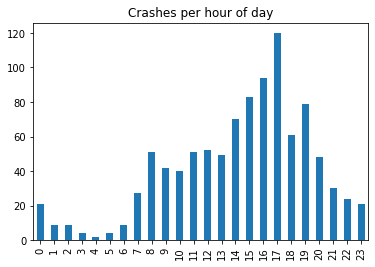

In [239]:
crashes['crash_hour'].value_counts().sort_index().plot.bar(title='Crashes per hour of day')


<AxesSubplot:title={'center':'Bicycle crashes by Month in 2021'}>

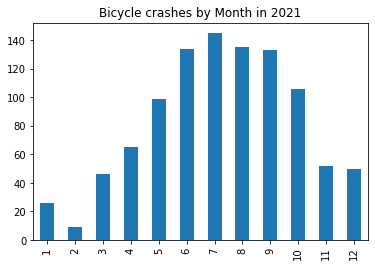

In [240]:
crashes['crash_month'].value_counts().sort_index().plot.bar(title='Bicycle crashes by Month in 2021')

<AxesSubplot:title={'center':'Percent of Injuries by type'}>

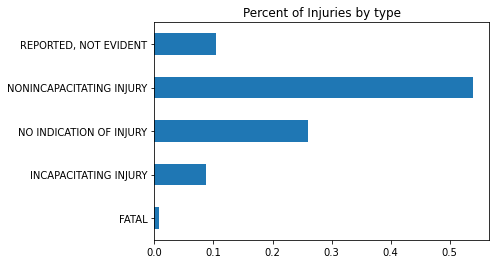

In [241]:
crashes['most_severe_injury'].value_counts(normalize=True).sort_index().plot.barh(title='Percent of Injuries by type')

In [242]:
# is there a correlation between time of day and degree of injury?
# need to add a numerical version of the "most severe injury" to df to answer question
# to do this, create the injury data dictionary and
# add a column filled with the map of text values to numerical vales
injury_dd = {'NO INDICATION OF INJURY':0,
             'REPORTED, NOT EVIDENT':1,
             'NONINCAPACITATING INJURY':2,
             'INCAPACITATING INJURY':3,
             'FATAL':4 }

crashes['degree_of_injury'] = crashes['most_severe_injury'].map(injury_dd)


In [243]:
crashes['most_severe_injury'].value_counts()

NONINCAPACITATING INJURY    540
NO INDICATION OF INJURY     260
REPORTED, NOT EVIDENT       105
INCAPACITATING INJURY        88
FATAL                         7
Name: most_severe_injury, dtype: int64

In [244]:
# here's another quick-and-dirty idea: what numerical values in the crash DF are correlated with each other?

corr_matrix = crashes.corr()
corr_matrix

,posted_speed_limit,street_no,beat_of_occurrence,num_units,injuries_total,injuries_fatal,injuries_incapacitating,injuries_non_incapacitating,injuries_reported_not_evident,injuries_no_indication,injuries_unknown,crash_hour,crash_day_of_week,crash_month,latitude,longitude,degree_of_injury
posted_speed_limit,1.000000,-0.123319,-0.088164,0.020748,0.038929,-0.009303,0.009410,0.054816,-0.039238,-0.010988,NaN,-0.020444,-0.021233,0.037862,-0.011999,0.005435,0.044237
street_no,-0.123319,1.000000,0.050071,0.010946,-0.006299,-0.002475,0.063142,-0.059544,0.032407,-0.011646,NaN,-0.009091,0.007480,0.031336,-0.182816,-0.263734,0.007942
beat_of_occurrence,-0.088164,0.050071,1.000000,-0.007816,-0.021817,-0.034105,-0.010789,-0.033591,0.042039,-0.039985,NaN,0.054238,0.071095,-0.002872,0.640602,-0.410343,-0.037177
num_units,0.020748,0.010946,-0.007816,1.000000,0.051244,-0.010435,0.090423,-0.004947,0.004194,0.135375,NaN,0.045571,-0.002132,-0.009940,0.022146,-0.016976,0.035982
injuries_total,0.038929,-0.006299,-0.021817,0.051244,1.000000,0.045384,0.167909,0.659102,0.210944,-0.548266,NaN,0.016667,-0.012950,-0.001082,-0.001019,-0.007839,0.851685
injuries_fatal,-0.009303,-0.002475,-0.034105,-0.010435,0.045384,1.000000,-0.026081,-0.089284,-0.028473,0.001000,NaN,-0.076901,-0.012690,0.037899,-0.016952,0.000341,0.213172
injuries_incapacitating,0.009410,0.063142,-0.010789,0.090423,0.167909,-0.026081,1.000000,-0.330327,-0.105343,-0.109281,NaN,-0.022806,-0.024125,-0.073015,0.008532,-0.032720,0.476082
injuries_non_incapacitating,0.054816,-0.059544,-0.033591,-0.004947,0.659102,-0.089284,-0.330327,1.000000,-0.360630,-0.352452,NaN,0.038399,-0.029883,-0.005813,-0.014220,0.033479,0.559681
injuries_reported_not_evident,-0.039238,0.032407,0.042039,0.004194,0.210944,-0.028473,-0.105343,-0.360630,1.000000,-0.121637,NaN,0.002089,0.055168,0.063499,0.018699,-0.037110,-0.162786
injuries_no_indication,-0.010988,-0.011646,-0.039985,0.135375,-0.548266,0.001000,-0.109281,-0.352452,-0.121637,1.000000,NaN,-0.020009,0.029917,0.009158,-0.013227,0.003625,-0.470804


degree of injury is most strongly correlated with
    injuries_total (.85),
    injuries_fatal (.21), 
    injuries_incapacitating (0.47)
    injuries_non_incapacitating (0.55)
Hour (-0.004), DOW (-0.0195), month (-0.0345) have almost no correlation

<AxesSubplot:title={'center':'Pct of reports by police beat'}>

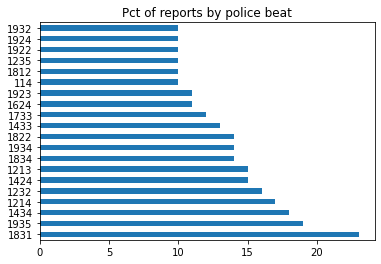

In [245]:
crashes['beat_of_occurrence'].value_counts().head(20).plot.barh(title='Pct of reports by police beat')

Where are these crashes with bicycles happening? Let's map the results

The following websites have been very helpful:
https://coderzcolumn.com/tutorials/data-science/interactive-maps-choropleth-scattermap-using-folium

https://georgetsilva.github.io/posts/mapping-points-with-folium/

Folium's documentation can be found at https://python-visualization.github.io/folium/index.html

In [246]:
mapCrashes = crashes.dropna(subset=['latitude','longitude'])
# create a new DF, dropping rows where lat/lon are NaN or blank
mapCrashes.shape

(993, 48)

In [247]:
crash_lat = mapCrashes['latitude']
crash_lon = mapCrashes['longitude']

# create M1, centered on the mean values of lat and lon in the DF

m1 = folium.Map(location=[crash_lat.mean(),crash_lon.mean()],tiles='OpenStreetMap',zoom_start = 11)

# go through the DF and plot dots for every crash report
for idx,row in mapCrashes.iterrows():
    lat, lon = row.latitude, row.longitude
    folium.CircleMarker(location=[lat,lon],
        radius = 2,
        color = 'red',
        popup = row['most_severe_injury']
                ).add_to(m1)
m1

In [248]:
# this map uses clusters to keep from getting overwhemed by the number of points
# it doesn't work very well, becuase the clusters are too large

m2 = folium.Map(location=[crash_lat.mean(),crash_lon.mean()],tiles='Stamen Terrain',zoom_start = 11)

from folium.plugins import MarkerCluster
marker_cluster = folium.plugins.MarkerCluster().add_to(m2)

for idx,row in mapCrashes.iterrows():
    lat, lon = row.latitude, row.longitude
    folium.CircleMarker(location=[lat,lon],
        color = 'red',
        popup = row['most_severe_injury'],
        radius = 1
        ).add_to(marker_cluster)

m2

In [249]:
# this map shows the DOW of the crash
# do crashes happen in different places based on the DOW?

# create alookup dictionary for the DOW with color codes
color_dow = {1:'green',7:'green'}
for i in range(2,7):
    color_dow[i] = 'red'

m3 = folium.Map(location=[crash_lat.mean(),crash_lon.mean()],tiles='Stamen Terrain',zoom_start = 11)

for idx,row in mapCrashes.iterrows():
    lat, lon = row.latitude, row.longitude
    folium.CircleMarker(location=[lat,lon],
        color = color_dow[row['crash_day_of_week']],
        popup = row['most_severe_injury'],
        radius = 2
        ).add_to(m3)
m3

In [250]:
# where are the worst injuries being suffered?
# 'FATAL' = black; 'INCAPACITATING INJURY' = red; others = yellow

color_injury = {'FATAL' : 'red',
                'INCAPACITATING INJURY' : 'yellow',
                'REPORTED, NOT EVIDENT' : 'orange',
                'NO INDICATION OF INJURY' : 'green',
                'NONINCAPACITATING INJURY' : 'blue'
                }

m4 = folium.Map(location=[crash_lat.mean(),crash_lon.mean()],tiles='Stamen Terrain',zoom_start = 11)

for idx,row in mapCrashes.iterrows():
    lat, lon = row.latitude, row.longitude
    folium.CircleMarker(location=[lat,lon],
        color = color_injury[row['most_severe_injury']],
        radius = 2,
        popup = 'DOW:' + str(row['crash_day_of_week']) + '<br>' +
            'Hour:' + str(row['crash_hour']) + '<br>',
        ).add_to(m4)
m4

TODO: the above map needs to have a legend showing what the different colors mean --> how to add a legend in Folium? 

The above maps show point data. It would be nice to have it grouped. The smallest reporting unit in the police crash data seems to be the beat number. So let's map the different beats and overlay information on the beat districts.

Geopandas will allow geo files to be read and processed as dataframes

https://www.twilio.com/blog/2017/08/geospatial-analysis-python-geojson-geopandas.html

https://geopandas.org/en/stable/docs/user_guide.html

The following box imports geopandas
reads the police beats file downloaded from CHI
(https://data.cityofchicago.org/Public-Safety/Boundaries-Police-Beats-current-/aerh-rz74)

It then creates a dictionary of beat numbers and the centerpoint for the beat (centroid).

The center points will be added to the mapCrashes df, so they can be plotted, with the N of crashes in each

In [253]:
#beats_url = 'https://data.cityofchicago.org/api/geospatial/aerh-rz74?method=export&format=GeoJSON'

dfile = '/home/alp/Downloads/Boundaries - Police Beats (current).geojson'
# add the beat outlines to the map

m5 = folium.Map(location=[crash_lat.mean(),crash_lon.mean()],tiles='Stamen Terrain',zoom_start = 11)

folium.GeoJson(dfile,name='geojson').add_to(m5)

# since we only want summary info for this map, create a new DF that is smaller and contains the N reports
# we could count any of the required fields; I choose "rd_no" becuase it is short
beat_map = mapCrashes.groupby('beat_of_occurrence')['rd_no'].count()

# convert the series into a DF
beat_map_df = pd.DataFrame({'beatNum': beat_map.index, 'nReports':beat_map.values})

# add a column with the beat number converted to a string with leading zeros
# (to match the GeoJSON data)
beat_map_df['beat_str'] = beat_map_df['beatNum'].apply('{:0>4}'.format)

# to put markers in the different beats, we need the lat/lon centroid for each beat
# this creats a dd with key = beatNum, val = [lat,lon] (value = list)
beats_dd ={}
for index, row in beats.iterrows():
    beats_dd[int(row['beat_num'])] = [row['geometry'].centroid.y,
                                      row['geometry'].centroid.x
                                    ]
beat_map_df['center_loc'] = beat_map_df['beatNum'].map(beats_dd)

# to add text to the map 
# https://stackoverflow.com/questions/51039161/how-to-add-a-label-on-each-circle-in-a-folium-circile-map-python

from folium.features import DivIcon

for idx,row in beat_map_df.iterrows():
    center = row.center_loc
    text = str(row.nReports)

    folium.Circle(location=center, 
                    color = 'red',
                    popup = 'Beat:' + str(row['beatNum']) + 'Reports:' + text,
                    fill=True
                    ).add_to(m5)

    folium.map.Marker(location = center,
                        icon = DivIcon( icon_size = (20,20), 
                                        icon_anchor = (0,0),
                                        html = '<div style="font-size: 9pt">%s</div>' % text,
                                    )
                        ).add_to(m5)
m5

The above map is helpful, but lets see if we can make it into a Choropleth map
https://coderzcolumn.com/tutorials/data-science/interactive-maps-choropleth-scattermap-using-folium

In [254]:
#beats_url = 'https://data.cityofchicago.org/api/geospatial/aerh-rz74?method=export&format=GeoJSON'
dfile = '/home/alp/Downloads/Boundaries - Police Beats (current).geojson'
'''
0   beat      277 non-null    object  
1   beat_num  277 non-null    object  
2   district  277 non-null    object  
3   sector    277 non-null    object  
4   geometry  277 non-null    geometry

beat_num is a string with leading zeros
'''

m6 = folium.Map(location=[crash_lat.mean(),crash_lon.mean()],tiles='Stamen Terrain',zoom_start = 11)

# COLUMNS tells folium what col to match to the geography file ('beat_num')
# the second field tells what col to summarize (nReports) for the color chart

folium.Choropleth(
    geo_data = dfile,
    name = 'choropleth',
    data = beat_map_df,
    columns = ['beat_str','nReports'],
    key_on='feature.properties.beat_num',
    fill_color='OrRd',
    fill_opacity=0.8,
    line_opacity=0.2,
    nan_fill_color = 'grey',
    legend_name='Bicycle Crashes Reported by Police Beat',
    ).add_to(m6)

for idx,row in beat_map_df.iterrows():
    center = row.center_loc
    text = str(row.nReports)

    folium.CircleMarker(location=center, 
                    color = 'red',
                    radius=1,
                    popup = 'Beat:' + row['beat_str'] + '<br>' +'Reports:' + text,
                    fill=True
                    ).add_to(m6)

m6

In [255]:
m1.save('AllBikeAccidents.html')
m2.save('BikeAccidentsClustered.html')
m3.save('BikeAccidentsByDOW.html')
m4.save('BikeAccidentsInjuryType.html')
m5.save('BikeAccidentsByPoliceBeat.html')
m6.save('BikeAccidentsByBeatColorized.html')